In [1]:
# directory
import os
import zipfile
import shutil
import random
import itertools
from functools import partial
from tqdm import tqdm

# dataframe
import pandas as pd
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve
from sklearn.metrics import auc as AUC

# image processing
import cv2
import albumentations as A
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import EarlyStopping, Callback, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2023-08-19 08:43:12.584984: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-19 08:43:12.841337: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-19 08:43:13.676953: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
#     zip_ref.extractall('breakhis')

In [3]:
df = pd.read_csv('breakhis/Folds.csv')

root_dir = 'breakhis/'
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [4]:
df.head()

,fold,mag,grp,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...


In [5]:
df = df.rename(columns={'filename': 'path'})

- Folds..csv contains images information that consist of magnitude, group (train, test), and path

before restructuring directory, we will add label to image file name for error analysis later

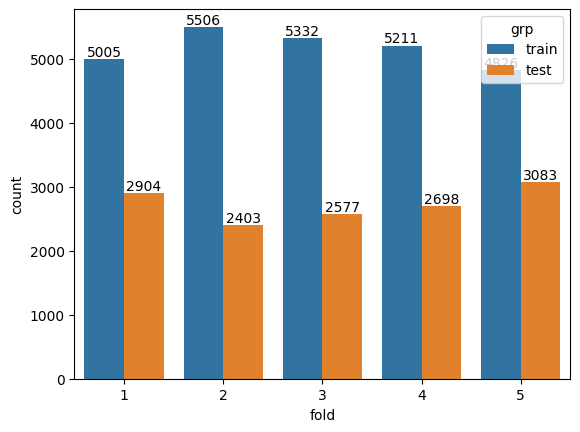

In [6]:
ax = sns.countplot(data=df, x='fold', hue='grp')
for container in ax.containers:
    ax.bar_label(container)

- It seems that fold is like proportion of train and test. Each folds contains 7909 images. Fold 2 contains most training data than other folds. So, we will choose fold 2.

In [7]:
df = (df[df['fold'] == 2].drop(columns='fold', axis=1)
                         .reset_index(drop=True))

df.shape

(7909, 3)

In [8]:
df['mag'] = df['mag'].astype('str')
df['type'] = df['path'].apply(lambda x: x.split('/')[5])
df['filename'] = df['path'].apply(lambda x: x.split('/')[-1])
df['path'] = df['path'].apply(lambda x: os.path.join('breakhis', x))
df['label'] = df['path'].apply(lambda x: x.split('/')[4])
df['filename'] = df['label'] + '_' + df['filename']
df['class'] = df['label'].apply(lambda x: 1 if x == 'malignant' else 0)

df.head()

,mag,grp,path,type,filename,label,class
0,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-001.png,benign,0
1,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-002.png,benign,0
2,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-003.png,benign,0
3,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-004.png,benign,0
4,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-005.png,benign,0


In [9]:
df['path'][0]

'breakhis/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png'

In [10]:
df1 = df[df['grp'] == 'train']
test_df = df[df['grp'] == 'test']

In [11]:
df1.shape, test_df.shape

((5506, 7), (2403, 7))

[Text(0, 0, '1756'), Text(0, 0, '3750')]

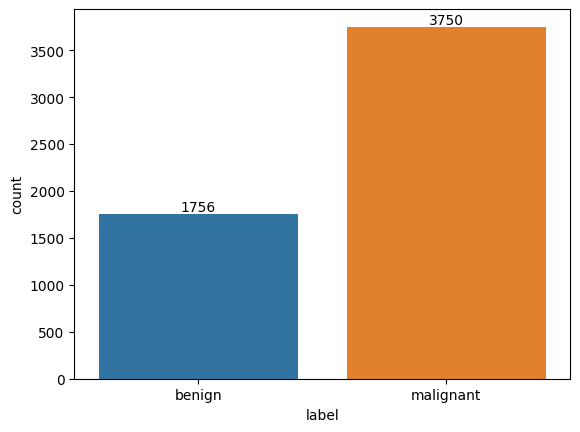

In [12]:
ax = sns.countplot(data=df1, x='label')
ax.bar_label(ax.containers[0])

[Text(0, 0, '253'), Text(0, 0, '782'), Text(0, 0, '393'), Text(0, 0, '328')]

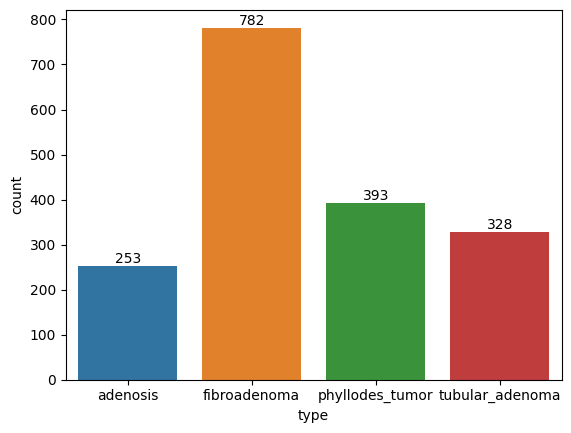

In [13]:
ax = sns.countplot(data=df1[df1['label']=='benign'], x='type')
ax.bar_label(ax.containers[0])

[Text(0, 0, '2531'), Text(0, 0, '351'), Text(0, 0, '460'), Text(0, 0, '408')]

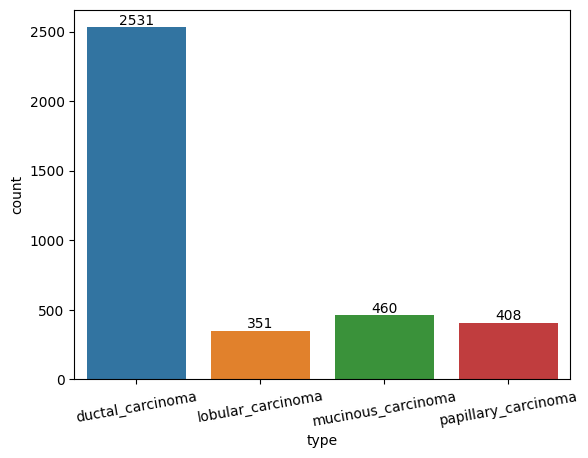

In [14]:
ax = sns.countplot(data=df1[df1['label']=='malignant'], x='type')
ax.set_xticklabels(ax.get_xticklabels(), rotation=10)
ax.bar_label(ax.containers[0])

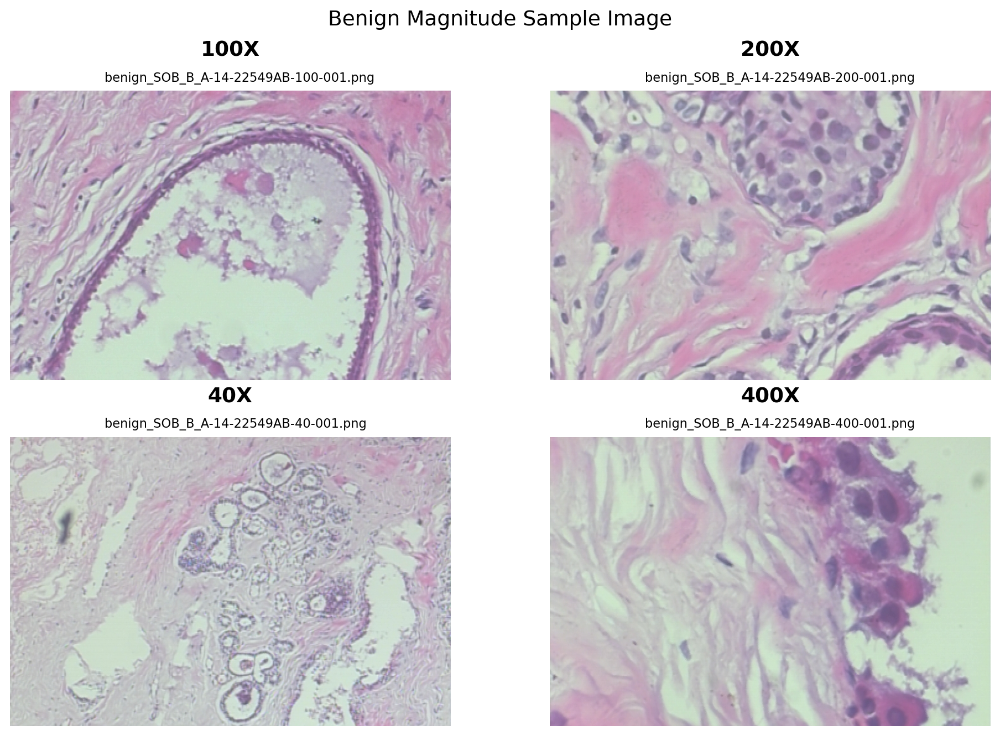

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = df1.groupby("mag", as_index=False).first()

for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = cv2.imread(row.path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    ax.imshow(img_rgb)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename, size=9)
    ax.axis("off")

plt.suptitle('Benign Magnitude Sample Image', fontsize=15)
plt.show()

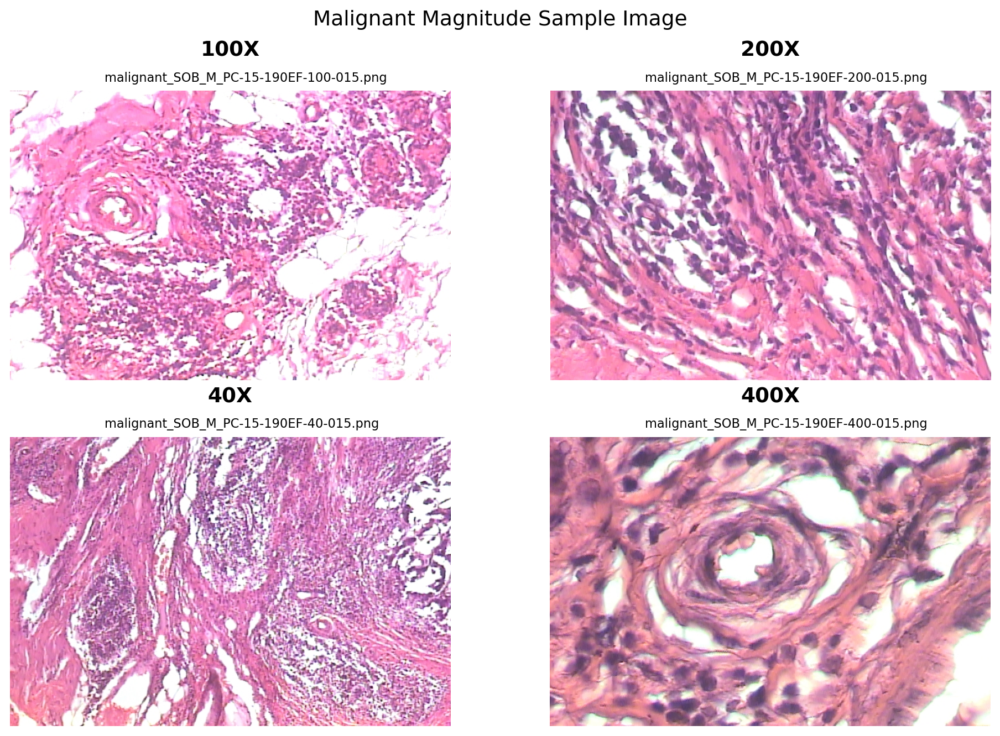

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = df1[df1['filename'].apply(lambda x: x.split('-')[-1]=='015.png')].groupby("mag", as_index=False).last() 

for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = cv2.imread(row.path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    ax.imshow(img_rgb)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename, size=9)
    ax.axis("off")

plt.suptitle('Malignant Magnitude Sample Image', fontsize=15)
plt.show()

## Data Preprocessing

### Define Helper Functions

In [17]:
BATCH_SIZE = 32
IMG_SIZE = 224
IMAGE_SHAPE = (IMG_SIZE,IMG_SIZE,3)

In [18]:
def load_process_image(file, label):
    img = tf.io.read_file(file)
    img = tf.image.decode_png(img, channels=3) # channels 3 = RGB

    return img, label

def resize_rescale(image, label):
    img = tf.cast(image, tf.float32)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])/255
    return img, label

def view_image(ds, col=8, row=2, size=(25,7)):
    plt.figure(figsize=size)
    plt.subplots_adjust(wspace=0.05, hspace=0.15)
    class_names = ['benign', 'malignant']
    for images, labels in ds.take(1):
        for i in range(col*row):
            ax = plt.subplot(row, col, i + 1)
            shape = str(images[i].numpy().shape)
            plt.imshow(images[i].numpy())
            plt.title(class_names[labels[i].numpy()])
            plt.axis("off") 
    plt.tight_layout
    return None

# def view_image(ds):
#     image, label = next(iter(ds)) # extract 1 batch from the dataset
#     image = image.numpy()
#     label = label.numpy()
    
#     fig = plt.figure(figsize=(22, 22))
#     for i in range(20):
#         ax = fig.add_subplot(4, 5, i+1, xticks=[], yticks=[])
#         ax.imshow(image[i])
#         ax.set_title(f"Label: {label[i]}")

        
def images_augmentation(img, IMG_SIZE):
    
    transforms = A.Compose([
        A.Rotate(limit=20),
        A.HorizontalFlip(),
        A.VerticalFlip(),
        A.RandomBrightnessContrast(
            p=0.5,
            brightness_limit=0.2, 
            contrast_limit=0.1,
            brightness_by_max=True
        ),
        A.ElasticTransform(
            alpha=1,
            interpolation=1, 
            border_mode=4 
        ),
        A.GridDistortion(
            num_steps=5, 
            distort_limit=0.3, 
            interpolation=1,
            border_mode=4
        ),
        A.Blur(
            p=0.3, 
            blur_limit=(1, 1)
        ),
    ])
    
    data = {'image': img}
    aug_data = transforms(**data)
    aug_img = aug_data["image"]
    aug_img = tf.cast(aug_img/255.0, tf.float32)
    aug_img = tf.image.resize(aug_img, size=[IMG_SIZE, IMG_SIZE])
    
    return aug_img

def process_augmentation(image, label, IMG_SIZE):
    aug_img = tf.numpy_function(func=images_augmentation, inp=[image, IMG_SIZE], Tout=tf.float32)
    return aug_img, label

def set_shapes(img, label, img_shape=IMAGE_SHAPE):
    img.set_shape(img_shape)
    label.set_shape(())
    return img, label

In [19]:
# split train data into train and validation
train_df, val_df = train_test_split(df1, test_size=0.2, random_state=0)

print(f"Train size: {train_df.shape}")
print(f"Validation size: {val_df.shape}")
print(f"Test size: {test_df.shape}")

Train size: (4404, 7)
Validation size: (1102, 7)
Test size: (2403, 7)


Text(0.5, 1.0, 'Test data')

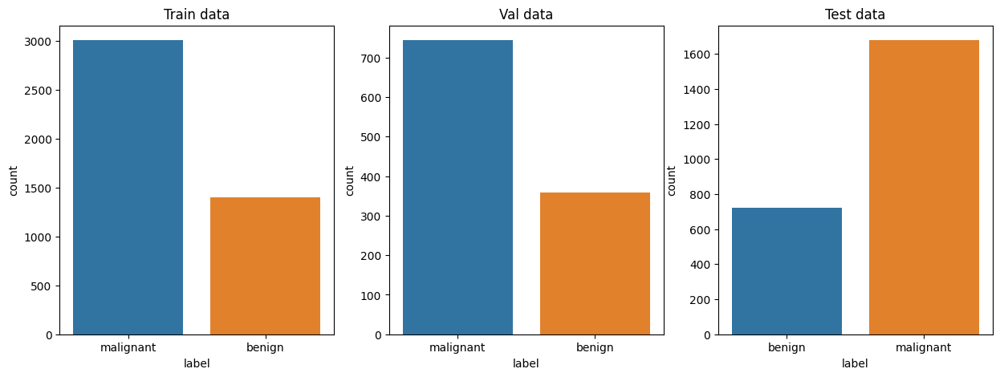

In [20]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
sns.countplot(data=train_df, x='label', ax=axs[0])
axs[0].set_title('Train data')

sns.countplot(data=val_df, x='label', ax=axs[1])
axs[1].set_title('Val data')

sns.countplot(data=test_df, x='label', ax=axs[2])
axs[2].set_title('Test data')

In [21]:
train_loader = tf.data.Dataset.from_tensor_slices((train_df['path'], train_df['class']))
val_loader = tf.data.Dataset.from_tensor_slices((val_df['path'], val_df['class']))

test_df = test_df.sample(frac=1, random_state=0)
test_loader = tf.data.Dataset.from_tensor_slices((test_df['path'], test_df['class']))

train_ds = (
    train_loader.shuffle(len(train_df))
    .map(load_process_image, num_parallel_calls=AUTOTUNE)
    .map(partial(process_augmentation, IMG_SIZE=IMG_SIZE), num_parallel_calls=AUTOTUNE)
    .map(set_shapes, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

val_ds = (
    val_loader.shuffle(len(val_df))
    .map(load_process_image, num_parallel_calls=AUTOTUNE)
    .map(resize_rescale, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

test_ds = (
    test_loader.shuffle(len(test_df))
    .map(load_process_image, num_parallel_calls=AUTOTUNE)
    .map(resize_rescale, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

2023-08-19 08:43:17.204845: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-19 08:43:17.331479: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-19 08:43:17.331528: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-19 08:43:17.334522: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-19 08:43:17.334568: I tensorflow/compile

In [22]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>

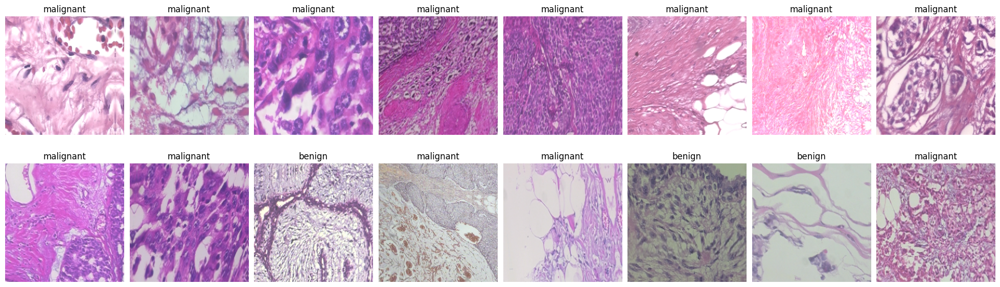

In [23]:
view_image(train_ds)

# Model Building

In [24]:
def create_model():
    
    model = Sequential([
        Conv2D(32, (3,3), activation='relu', input_shape=IMAGE_SHAPE),
        MaxPooling2D(2,2),
        
        Conv2D(64, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Conv2D(128, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Conv2D(256, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Flatten(),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])
    
    lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
        initial_learning_rate=0.001,
        decay_steps=1200,
        decay_rate=0.35,
    )
    
    model.compile(
        optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name="roc_auc")]
    )
    
    return model

In [25]:
# model = load_model('custom_model.keras')

# lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
#     initial_learning_rate=0.001,
#     decay_steps=1200,
#     decay_rate=0.3,
# )

# model.compile(
#     optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
#     loss='binary_crossentropy',
#     metrics=[tf.keras.metrics.AUC(name="roc_auc")]
# )

In [26]:
callbacks = [
    EarlyStopping(
        monitor='val_roc_auc',
        # min_delta=1e-4,
        patience=3,
        verbose=1
    ),
    ModelCheckpoint(
        filepath='custom_model3.h5',
        save_best_only=True,
        verbose=1
    )
]

In [27]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

In [28]:
history = model.fit(
    train_ds,
    epochs=30,
    verbose=1,
    validation_data=val_ds,
    callbacks=[callbacks]
)

Epoch 1/30


2023-08-19 08:43:24.809316: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8904
2023-08-19 08:43:27.148445: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-08-19 08:43:27.615057: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f93b8048d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-08-19 08:43:27.615109: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2023-08-19 08:43:27.650472: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-08-19 08:43:27.836159: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifeti

138/138 [==============================] - ETA: 0s - loss: 0.5514 - roc_auc: 0.7360
Epoch 1: val_loss improved from inf to 0.61877, saving model to custom_model3.h5
138/138 [==============================] - 72s 451ms/step - loss: 0.5514 - roc_auc: 0.7360 - val_loss: 0.6188 - val_roc_auc: 0.8593


/home/anggapark/miniconda3/envs/tf/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 2/30
138/138 [==============================] - ETA: 0s - loss: 0.4763 - roc_auc: 0.8221
Epoch 2: val_loss improved from 0.61877 to 0.44500, saving model to custom_model3.h5
138/138 [==============================] - 60s 432ms/step - loss: 0.4763 - roc_auc: 0.8221 - val_loss: 0.4450 - val_roc_auc: 0.8614
Epoch 3/30
138/138 [==============================] - ETA: 0s - loss: 0.4352 - roc_auc: 0.8470
Epoch 3: val_loss improved from 0.44500 to 0.37877, saving model to custom_model3.h5
138/138 [==============================] - 63s 453ms/step - loss: 0.4352 - roc_auc: 0.8470 - val_loss: 0.3788 - val_roc_auc: 0.8736
Epoch 4/30
138/138 [==============================] - ETA: 0s - loss: 0.4230 - roc_auc: 0.8529
Epoch 4: val_loss improved from 0.37877 to 0.37162, saving model to custom_model3.h5
138/138 [==============================] - 64s 458ms/step - loss: 0.4230 - roc_auc: 0.8529 - val_loss: 0.3716 - val_roc_auc: 0.8741
Epoch 5/30
138/138 [==============================] - ETA: 0s - 

# Model Result

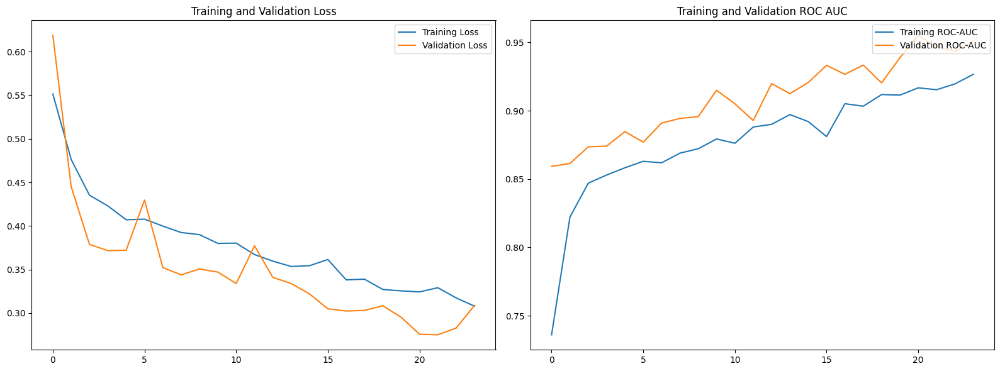

In [29]:
# Genning the roc auc
roc_auc = history.history['roc_auc']
val_roc_auc = history.history['val_roc_auc']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

# Plotting Training and Validation accuracy
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Plotting Training and Validation Loss
ax[0].plot(epochs_range, loss, label='Training Loss')
ax[0].plot(epochs_range, val_loss, label='Validation Loss')
ax[0].legend(loc='upper right')
ax[0].set_title('Training and Validation Loss')

# Plotting Training and Validation ROC AUC
ax[1].plot(epochs_range, roc_auc, label='Training ROC-AUC')
ax[1].plot(epochs_range, val_roc_auc, label='Validation ROC-AUC')
ax[1].legend(loc='upper right')
ax[1].set_title('Training and Validation ROC AUC')

plt.tight_layout()
plt.show()

## Evaluate Model

In [30]:
loss, roc_auc_score = model.evaluate(test_ds, verbose=0)
print(f"\nROC-AUC:   {roc_auc_score:.5f}", 
      f"Loss:      {loss:.5f}\n", sep="\n")


ROC-AUC:   0.84772
Loss:      0.46814



In [50]:
# pred = model.predict(test_ds)
# pred

In [49]:
# Convert predictions to class labels
# pred_class = (pred > 0.5).astype('int').flatten()
# pred_class

array([1, 1, 0, ..., 0, 1, 1])

In [46]:
# model.save('custom_model_tfdata.keras')

In [81]:
def plot_confusion_matrix(ax, cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):

    print(cm)

    ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.set_title(title)
    # ax.colorbar()
    tick_marks = np.arange(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(classes)
    ax.set_yticklabels(classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')
    

def plot_roc_curve(ax, fpr, tpr, roc_auc):

    ax.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    # ax.set_title('Receiver Operating Characteristic for Class: ')
    ax.legend(loc="lower right")
    

def evaluate_model_on_dataset(model, dataset, thres=0.5):
    true_labels = []
    predicted_probs = []

    for batch in dataset:
        images, labels = batch
        true_labels.extend(labels.numpy())
        predictions = model.predict(images)
        predicted_probs.extend(predictions)

    true_labels = np.array(true_labels)
    predicted_probs = np.array(predicted_probs)

    predicted_classes = (predicted_probs > thres).astype('int')

    # Calculate confusion matrix
    confusion_mtx = confusion_matrix(true_labels, predicted_classes)

    # Calculate ROC curve and AUC score
    fpr_curve, tpr_curve, _ = roc_curve(true_labels, predicted_probs)
    roc_auc = AUC(fpr_curve, tpr_curve)

    return confusion_mtx, fpr_curve, tpr_curve, roc_auc, thres

1/1 [==============================] - 0s 19ms/step
[[ 434  290]
 [ 137 1542]]


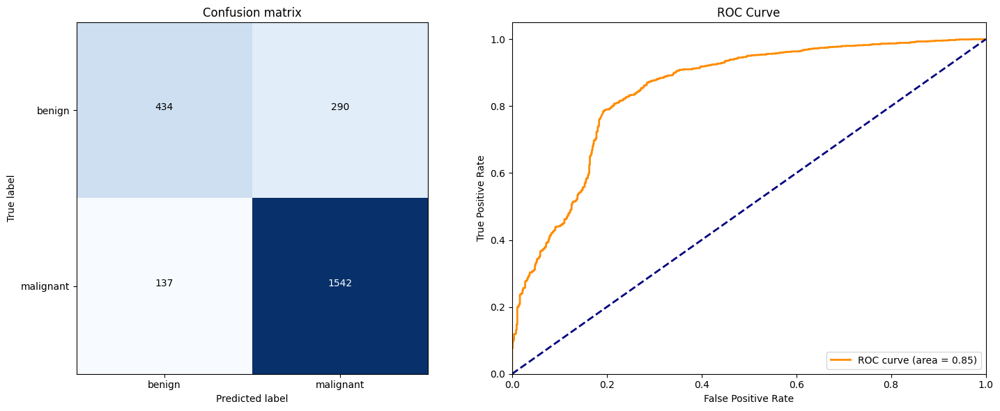

In [83]:
# Evaluate the model on the dataset and get evaluation results
confusion_mtx, fpr, tpr, roc_auc, thresholds = evaluate_model_on_dataset(model, test_ds, thres=0.3)
# print(f"Optimal Threshold: {optimal_threshold}")
# Plot confusion matrix and ROC curve
class_names = ["benign", "malignant"]  # Modify based on your classes
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot confusion matrix
plot_confusion_matrix(axs[0], confusion_mtx, class_names)

# Plot ROC curve
plot_roc_curve(axs[1], fpr, tpr, roc_auc)
axs[1].set_title('ROC Curve')

plt.tight_layout()
plt.show()